    NAME- RISHI KUMAR
    CWID- 20015656

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import warnings

from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from six import StringIO
import pydotplus
from sklearn import tree
from sklearn.tree import export_graphviz
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from IPython.display import Image
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
df = pd.read_csv(r'C:\Users\Rishi\Downloads\combined.csv')
df.head()

,date,county,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,FIRE_NAME,CAUSE,lat,long,GIS_ACRES
0,2008-07,Santa Barbara County,89.129032,59.709677,80.548387,0.0,41.451613,7.354839,0.0,72.937634,34.079570,0.010000,13.164516,no_fire,0,34.54,-120.04,0.000000
1,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,SERPENTINE,1,38.18,-120.56,176.763400
2,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,POOL 2 - MAIN,10,38.18,-120.56,73.444778
3,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,FRENCH,14,38.18,-120.56,101.074150
4,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,EVANS,6,38.18,-120.56,103.968050


In [3]:
df.describe()

,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,CAUSE,lat,long,GIS_ACRES
count,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,1.098800e+04,10988.000000,10988.000000,10988.000000,10988.000000,1.098800e+04
mean,72.789618,49.036346,64.676692,0.087918,54.408352,5.583294,0.072370,61.760095,57.089738,2.660346e-01,11.292206,2.866582,37.667330,-120.600429,9.799023e+02
std,15.735935,11.425170,14.635490,0.420449,16.926551,1.514516,0.133537,13.136071,15.399669,3.498030e-01,2.113807,4.972688,2.277839,1.963197,1.478595e+04
min,26.214286,0.642857,19.483871,0.000000,10.466667,2.354839,0.000000,22.195853,12.664516,-4.440000e-16,4.800000,0.000000,33.020000,-123.980000,0.000000e+00
25%,61.056452,42.123560,53.870968,0.000000,41.165323,4.533333,0.003226,52.827688,46.095699,4.247312e-02,9.796774,0.000000,36.230000,-122.040000,0.000000e+00
50%,72.951075,49.633333,65.290323,0.000000,54.098387,5.354839,0.020000,61.135663,57.857168,1.354839e-01,11.423333,0.000000,37.930000,-120.720000,0.000000e+00
75%,85.032258,56.677419,75.900806,0.000000,67.903226,6.354839,0.080645,71.280824,69.275627,3.442684e-01,13.274194,2.000000,39.270000,-119.750000,1.393641e+01
max,110.935484,88.935484,102.612903,9.229108,95.935484,14.129032,1.748387,100.311470,93.598694,3.619931e+00,14.500000,19.000000,41.750000,-115.360000,1.032699e+06


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10988 entries, 0 to 10987
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         10988 non-null  object 
 1   county       10988 non-null  object 
 2   maxtempF     10988 non-null  float64
 3   mintempF     10988 non-null  float64
 4   avgtempF     10988 non-null  float64
 5   totalSnow    10988 non-null  float64
 6   humid        10988 non-null  float64
 7   wind         10988 non-null  float64
 8   precip       10988 non-null  float64
 9   q_avgtempF   10988 non-null  float64
 10  q_avghumid   10988 non-null  float64
 11  q_sumprecip  10988 non-null  float64
 12  sunHour      10988 non-null  float64
 13  FIRE_NAME    10988 non-null  object 
 14  CAUSE        10988 non-null  int64  
 15  lat          10988 non-null  float64
 16  long         10988 non-null  float64
 17  GIS_ACRES    10988 non-null  float64
dtypes: float64(14), int64(1), object(3)
memory usa

In [5]:
df.corr()

,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,CAUSE,lat,long,GIS_ACRES
maxtempF,1.000000,0.865016,0.989024,-0.402649,-0.767948,-0.180935,-0.547077,0.061571,-0.083646,-0.015249,0.683187,0.345990,-0.271507,0.218114,0.052896
mintempF,0.865016,1.000000,0.915535,-0.408530,-0.601714,-0.049146,-0.453859,0.072651,-0.078869,-0.017533,0.552262,0.278266,-0.378032,0.227916,0.043949
avgtempF,0.989024,0.915535,1.000000,-0.401118,-0.737405,-0.128919,-0.530129,0.066635,-0.088644,-0.018118,0.703223,0.339694,-0.293452,0.228397,0.051676
totalSnow,-0.402649,-0.408530,-0.401118,1.000000,0.296972,0.093917,0.521309,-0.019156,0.013605,0.000089,-0.252369,-0.104948,0.124355,0.017262,-0.013733
humid,-0.767948,-0.601714,-0.737405,0.296972,1.000000,0.166985,0.545334,-0.048607,0.054815,0.000241,-0.479309,-0.288855,0.290597,-0.474029,-0.046375
wind,-0.180935,-0.049146,-0.128919,0.093917,0.166985,1.000000,0.149786,-0.028435,0.021868,-0.009988,0.030909,-0.148957,0.040586,-0.017300,-0.033482
precip,-0.547077,-0.453859,-0.530129,0.521309,0.545334,0.149786,1.000000,-0.030226,0.027883,0.000928,-0.480657,-0.220261,0.244541,-0.179909,-0.027681
q_avgtempF,0.061571,0.072651,0.066635,-0.019156,-0.048607,-0.028435,-0.030226,1.000000,-0.734589,-0.603752,0.036685,0.026891,-0.005664,0.015606,0.038317
q_avghumid,-0.083646,-0.078869,-0.088644,0.013605,0.054815,0.021868,0.027883,-0.734589,1.000000,0.584004,-0.063950,-0.016361,-0.010665,-0.002504,-0.038007
q_sumprecip,-0.015249,-0.017533,-0.018118,0.000089,0.000241,-0.009988,0.000928,-0.603752,0.584004,1.000000,-0.029439,0.012413,-0.013444,0.003524,-0.022173


In [6]:
df.isna()

,date,county,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,FIRE_NAME,CAUSE,lat,long,GIS_ACRES
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10983,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
10984,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
10985,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
10986,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


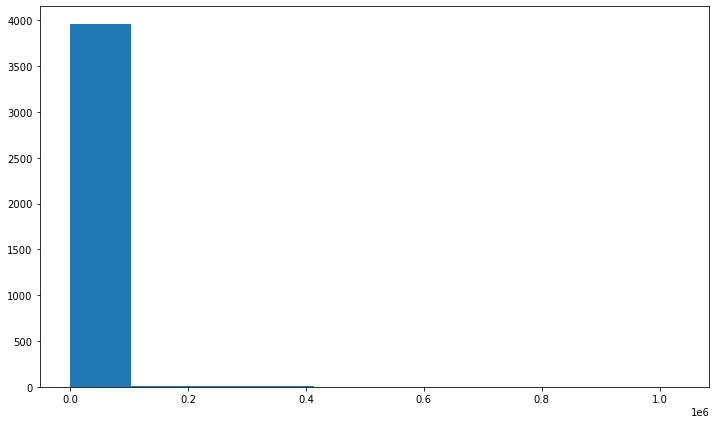

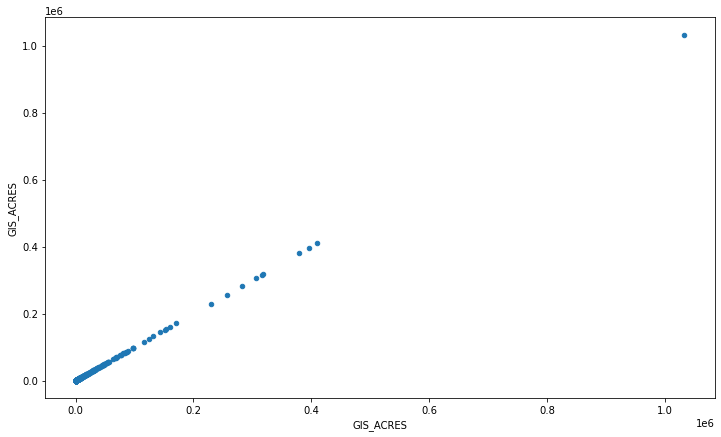

In [7]:
fire_df = df[df['GIS_ACRES'] > 0]

plt.figure(figsize=(12, 7))
plt.hist(fire_df['GIS_ACRES'])
fire_df.plot(kind='scatter', x='GIS_ACRES', y='GIS_ACRES', figsize=(12, 7));

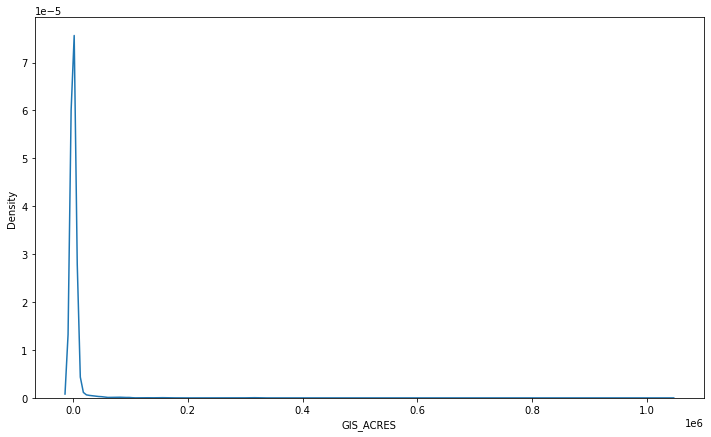

In [8]:
plt.figure(figsize=(12, 7))
sns.distplot(fire_df['GIS_ACRES'], hist=False,);

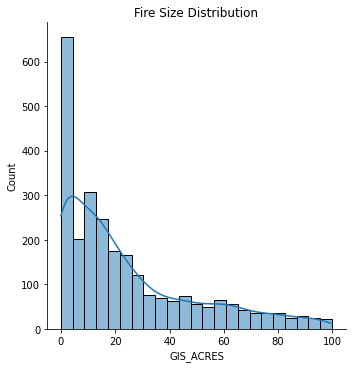

In [9]:
fig_1 = sns.displot(fire_df[fire_df['GIS_ACRES'] < 100]['GIS_ACRES'],
            kde=True,);
fig_1.set(title = "Fire Size Distribution");

In [10]:
fire_df = fire_df[fire_df['GIS_ACRES'] < 100]
fire_df.describe()

,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,CAUSE,lat,long,GIS_ACRES
count,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2.624000e+03,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000
mean,81.330914,53.973564,72.604849,0.017671,46.665333,5.187957,0.025802,61.737325,56.939250,2.756160e-01,12.463806,8.269055,37.059695,-120.105572,24.152576
std,11.763966,9.013811,11.026539,0.124869,13.073656,1.270393,0.051299,12.373971,14.901146,3.461555e-01,1.679422,5.286242,2.610631,1.978110,24.709823
min,35.178571,17.964286,28.250000,0.000000,12.766667,2.500000,0.000000,27.922427,13.887097,-8.330000e-17,6.822581,1.000000,33.020000,-123.980000,0.001515
25%,73.800000,48.838710,66.200000,0.000000,37.032258,4.366667,0.000000,52.934581,46.707527,4.537634e-02,11.473333,2.000000,34.360000,-121.340000,4.363766
50%,82.677419,54.000000,74.000000,0.000000,46.700000,4.935484,0.006452,60.799283,57.659498,1.425922e-01,12.503226,9.000000,36.610000,-120.040000,15.401242
75%,89.166667,59.935484,80.133333,0.000000,54.975806,5.800000,0.029032,71.012186,68.579781,3.518433e-01,14.083871,14.000000,39.270000,-118.730000,35.613159
max,108.451613,86.677419,102.064516,2.167894,87.354839,11.433333,0.483871,98.055914,93.598694,3.619931e+00,14.500000,19.000000,41.750000,-115.360000,99.837486


In [11]:
# Creating a copy of the main dataframe.
fire_map_data = df[df['GIS_ACRES'] > 0]

# Changing the cause of the fire from a number to it's corresponding cause.
cause_dict = {1: "Lightning",
              2: "Equipment Use",
              3: "Smoking",
              4: "Campfire",
              5: "Debris",
              6: "Railroad",
              7: "Arson",
              8: "Playing with Fire",
              9: "Miscellaneous",
              10: "Vehicle",
              11: "Powerline",
              12: "Firefighter Training",
              13: "None-Firefighter Training",
              14: "Unknown",
              15: "Structure",
              16: "Aircraft",
              18: "Escaped Prescribed Burn",
              19: "Illegal Alien Campfire"
}

fire_map_data['CAUSE'] = fire_map_data['CAUSE'].map(cause_dict)
fire_map_data.columns = map(str.lower, fire_map_data.columns)

# Setting Up Map Object.
fire_map = folium.Map(location=[37.50, -120.04], zoom_start=6)


# Adding Fires to Map.
for lat, long, cause, acres, date, name in zip(fire_map_data['lat'],
                                         fire_map_data['long'],
                                         fire_map_data['cause'],
                                         fire_map_data['gis_acres'],
                                         fire_map_data['date'],
                                         fire_map_data['fire_name']):
    folium.CircleMarker([lat, long],
                        radius=0.000075 * acres,
                        color = 'red',
                        fill_opacity=0.5,
                        fill=True,
                        popup=folium.Popup(f'Fire Name: {name.title()}'

                                           f'Fire Cause: {cause}' 

                                           f'Acres Burned: {acres:.2f}'

                                           f'Date of Fire: {date}',
                                           max_width=1000)
                         ).add_to(fire_map)

fire_map

-------------------------------------- Monthly Data Pairplots --------------------------------------


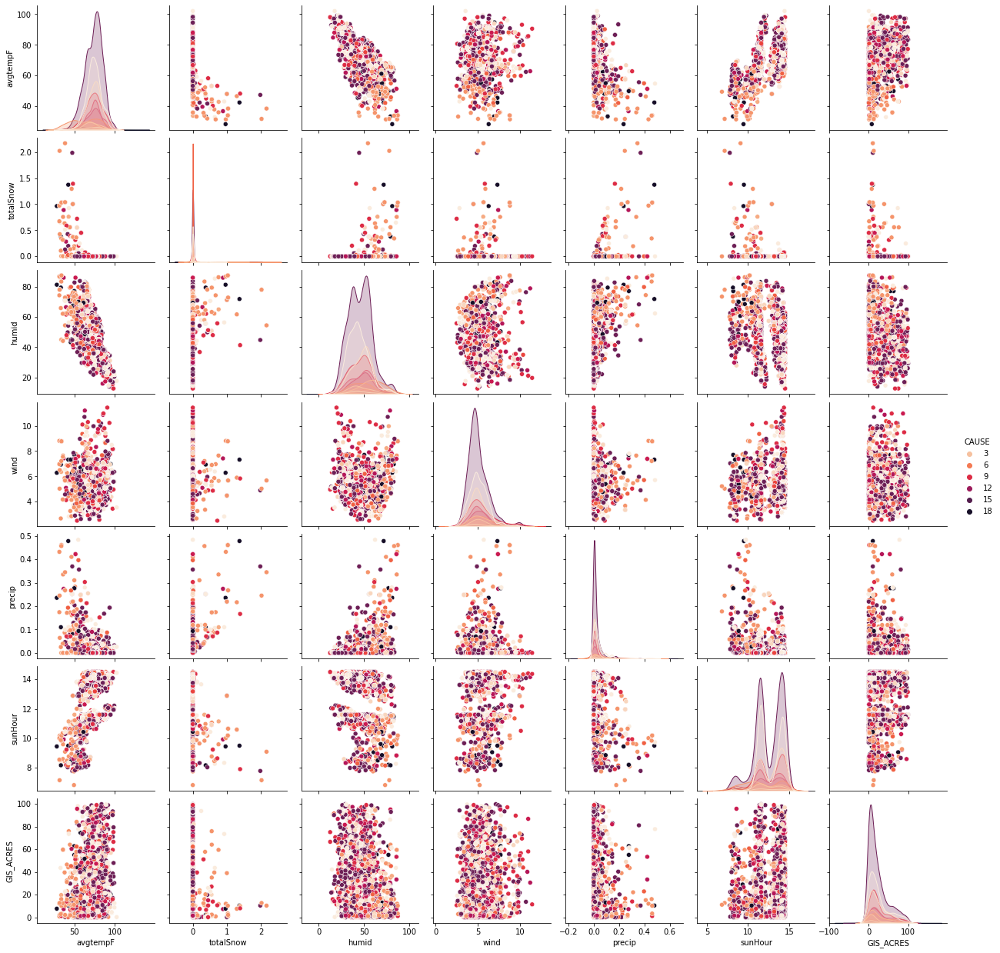

In [12]:
# Creating 2 sets of variables (Monthly and Quarterly)
d_features = ['avgtempF', 'totalSnow', 'humid', 'wind', 'precip', 'sunHour', 'CAUSE', 'GIS_ACRES']
q_features = ['q_avgtempF', 'q_avghumid', 'q_sumprecip', 'wind', 'sunHour', 'CAUSE', 'GIS_ACRES']

# Pairplots
print(f" Monthly Data Pairplots ".center(100, '-'))
sns.pairplot(fire_df[d_features], hue="CAUSE", palette='rocket_r');

------------------------------------- Quarterly Data Pairplots -------------------------------------


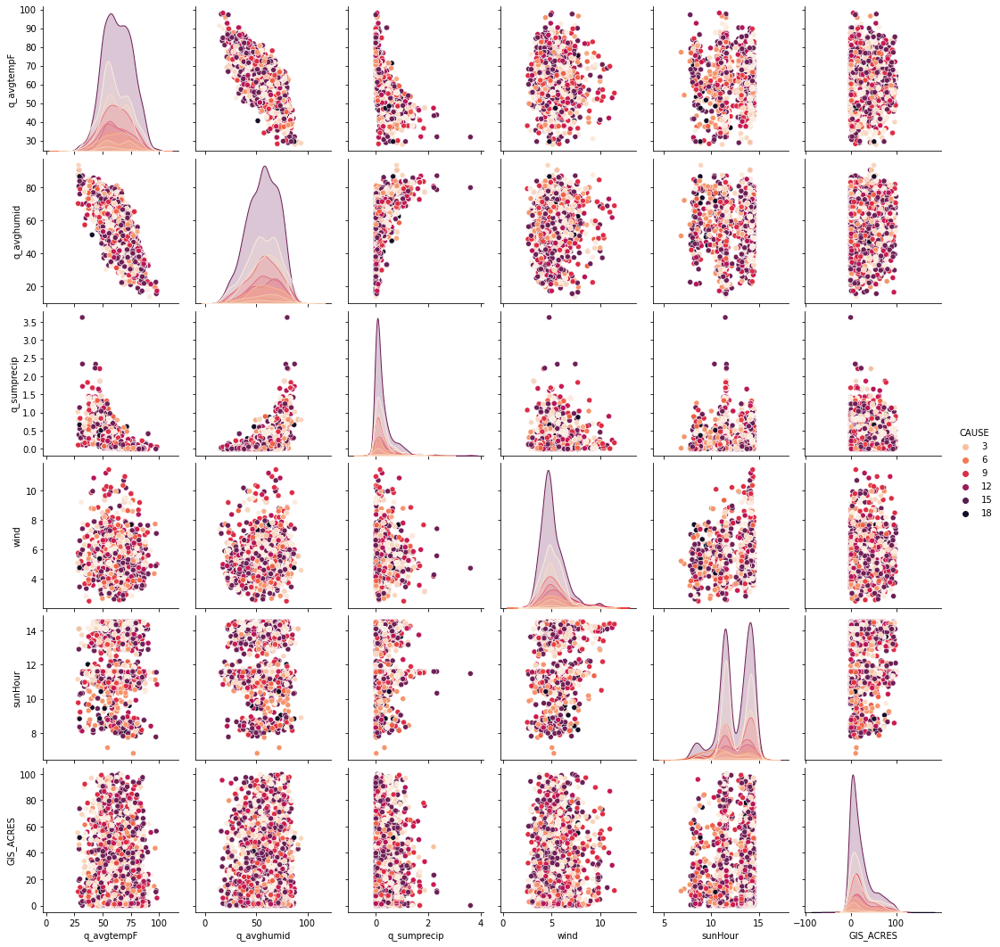

In [13]:
print(f" Quarterly Data Pairplots ".center(100, '-'))
sns.pairplot(fire_df[q_features], hue="CAUSE", palette='rocket_r');

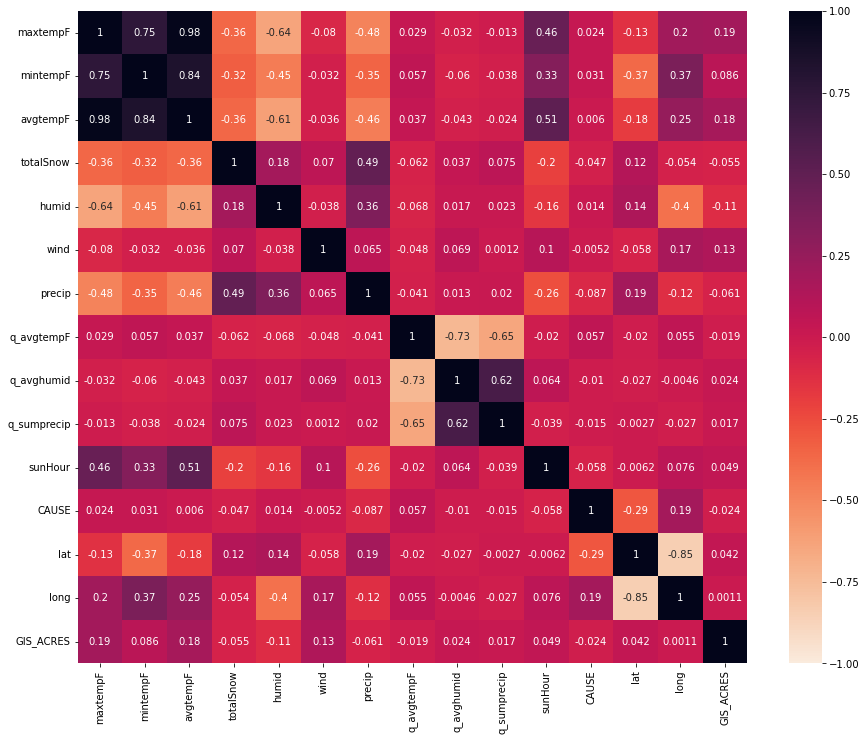

In [14]:
plt.figure(figsize=(15, 12))
sns.heatmap(fire_df.corr(), vmin=-1, vmax=1, annot=True, cmap='rocket_r');

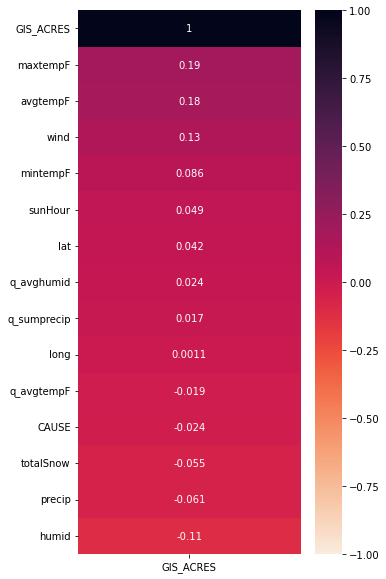

In [15]:
plt.figure(figsize=(5, 10))
sns.heatmap(fire_df.corr()[['GIS_ACRES']].sort_values(by='GIS_ACRES', ascending=False),
            vmin=-1,
            vmax=1,
            annot=True,
            cmap='rocket_r');

In [16]:
fire_df.sort_values(by='GIS_ACRES', ascending=False)[['county', 'FIRE_NAME', 'GIS_ACRES']].head(10)

,county,FIRE_NAME,GIS_ACRES
1827,Riverside County,GILMAN,99.837486
7822,Shasta County,R-3 MUD,99.573639
9543,Santa Barbara County,RANGE,99.083054
2555,Riverside County,CABAZON,98.980995
4373,Napa County,HIGHLAND,98.822746
1378,Kern County,BRAMLETTE,98.147751
3369,Riverside County,FREEWAY,97.775436
6014,Lake County,DEER,97.552078
2455,Riverside County,CAHUILLA,97.545860
6020,Glenn County,36,97.439041


In [17]:
# Finding Top 10 Fires.
top_10_fires = fire_df.sort_values(by='GIS_ACRES', ascending=False).head(10)
top_10_fires['CAUSE'] = top_10_fires['CAUSE'].map(cause_dict)
top_10_fires.columns = map(str.lower, top_10_fires.columns)

# Setting Up Map Object
fire_map_2 = folium.Map(location=[37.50, -120.04], zoom_start=6)


# Adding Fires to Map.
for lat, long, cause, acres, date, name in zip(top_10_fires['lat'],
                                         top_10_fires['long'],
                                         top_10_fires['cause'],
                                         top_10_fires['gis_acres'],
                                         top_10_fires['date'],
                                         top_10_fires['fire_name']):
    folium.CircleMarker([lat, long],
                        radius=0.25 * acres,
                        color = 'red',
                        fill_opacity=0.5,
                        fill=True,
                        popup=folium.Popup(f'Fire Name: {name.title()}'
                                           f'Fire Cause: {cause}'
                                           f'Acres Burned: {acres:.2f}'
                                           f'Date of Fire: {date}',
                                           max_width=1000)
                         ).add_to(fire_map_2)

fire_map_2

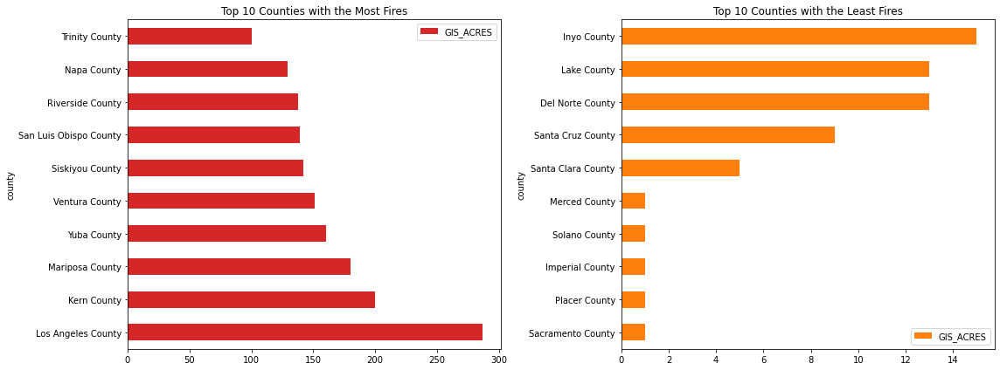

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6), tight_layout=True)

(fire_df[['county','GIS_ACRES']]
 .groupby('county')
 .count()
 .sort_values(by='GIS_ACRES', ascending=False)
 .head(10)
 .plot(kind='barh', title='Top 10 Counties with the Most Fires', color='tab:red', ax=axes[0]))

(fire_df[['county','GIS_ACRES']]
 .groupby('county')
 .count()
 .sort_values(by='GIS_ACRES')
 .head(10)
 .plot(kind='barh', title='Top 10 Counties with the Least Fires', color='tab:orange', ax=axes[1]));

In [19]:
df = df.drop(columns=['FIRE_NAME', 'lat', 'long'])

In [20]:
df['bool'] = (df['GIS_ACRES'] > 0) * 1

In [21]:
df['date'] = [x.split('-') for x in df['date']]

In [22]:
df['year'] = [int(x[0]) for x in df['date']]

In [23]:
df['month'] = [int(x[1]) for x in df['date']]

In [24]:
df.shape

(10988, 18)

In [25]:
df_dummy = pd.get_dummies(df, columns=['month'])

In [26]:
df_dummy.head()

,date,county,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,...,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,"[2008, 07]",Santa Barbara County,89.129032,59.709677,80.548387,0.0,41.451613,7.354839,0.0,72.937634,...,0,0,0,0,1,0,0,0,0,0
1,"[2008, 07]",Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,...,0,0,0,0,1,0,0,0,0,0
2,"[2008, 07]",Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,...,0,0,0,0,1,0,0,0,0,0
3,"[2008, 07]",Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,...,0,0,0,0,1,0,0,0,0,0
4,"[2008, 07]",Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,...,0,0,0,0,1,0,0,0,0,0


In [27]:
df_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10988 entries, 0 to 10987
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         10988 non-null  object 
 1   county       10988 non-null  object 
 2   maxtempF     10988 non-null  float64
 3   mintempF     10988 non-null  float64
 4   avgtempF     10988 non-null  float64
 5   totalSnow    10988 non-null  float64
 6   humid        10988 non-null  float64
 7   wind         10988 non-null  float64
 8   precip       10988 non-null  float64
 9   q_avgtempF   10988 non-null  float64
 10  q_avghumid   10988 non-null  float64
 11  q_sumprecip  10988 non-null  float64
 12  sunHour      10988 non-null  float64
 13  CAUSE        10988 non-null  int64  
 14  GIS_ACRES    10988 non-null  float64
 15  bool         10988 non-null  int32  
 16  year         10988 non-null  int64  
 17  month_1      10988 non-null  uint8  
 18  month_2      10988 non-null  uint8  
 19  mont

In [28]:
X = df_dummy.drop(columns=['GIS_ACRES', 'date', 'q_avgtempF', 'q_avghumid', 'q_sumprecip', 'maxtempF', 'mintempF', 'CAUSE', 'bool', 'county'])
y = df_dummy['bool']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.3)

In [29]:
df['bool'].value_counts(normalize=True)

0    0.638424
1    0.361576
Name: bool, dtype: float64

In [30]:
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)

In [31]:
# Decision tree classifier function  and classification report and acuracy
#print(X_test_sc, y_test)
dec_tree = tree.DecisionTreeClassifier()
trained  = dec_tree.fit(X_train,y_train)
y_pred = dec_tree.predict(X_test)

print("Classification Report: \n\n",classification_report(y_test, y_pred))
acc_dec = accuracy_score(y_test, y_pred)
print("Accuracy: ",acc_dec)

Classification Report: 

               precision    recall  f1-score   support

           0       0.90      0.84      0.87      2098
           1       0.75      0.83      0.79      1199

    accuracy                           0.84      3297
   macro avg       0.82      0.84      0.83      3297
weighted avg       0.84      0.84      0.84      3297

Accuracy:  0.8377312708522899


In [32]:
#visualizing decision tree

data = export_graphviz(dec_tree, out_file=None,feature_names=X_train.columns)
graph = pydotplus.graph_from_dot_data(data)
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.598757 to fit

(process:14856): GLib-GIO-WARNING **: 12:51:56.448: Unexpectedly, UWP app `AcerIncorporated.PredatorSenseV30_3.0.3162.0_x64__48frkmn4z8aw4' (AUMId `AcerIncorporated.PredatorSenseV30_48frkmn4z8aw4!CentenialConvert') supports 1 extensions but has no verbs

(process:14856): GLib-GIO-WARNING **: 12:51:56.669: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.5.5.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs



In [33]:
# grid search CV function

import warnings
from sklearn.model_selection import GridSearchCV
warnings.filterwarnings("ignore")
tuned_parameters = {
    'criterion': ['gini','entropy'],
    'max_leaf_nodes': [2,3,4,5,6,7,8,9,10,11],
}

clf = GridSearchCV(estimator=RandomForestClassifier(), param_grid=tuned_parameters,scoring='accuracy', cv=10, n_jobs=-1)

clf.fit(X_train_sc, y_train)

print("Best parameters set found on development set:")
print()
print(clf.best_params_)
print()
print("Grid scores on development set:")
print()
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"% (mean, std * 2, params))
    
print()
print("Detailed classification report:")
print()
y_true, y_pred_cv = y_test, clf.predict(X_test_sc)
print(classification_report(y_true, y_pred_cv))
print()
print("Accuracy: ",accuracy_score(y_test, y_pred_cv))

Best parameters set found on development set:

{'criterion': 'gini', 'max_leaf_nodes': 11}

Grid scores on development set:

0.674 (+/-0.038) for {'criterion': 'gini', 'max_leaf_nodes': 2}
0.747 (+/-0.036) for {'criterion': 'gini', 'max_leaf_nodes': 3}
0.754 (+/-0.028) for {'criterion': 'gini', 'max_leaf_nodes': 4}
0.755 (+/-0.025) for {'criterion': 'gini', 'max_leaf_nodes': 5}
0.755 (+/-0.027) for {'criterion': 'gini', 'max_leaf_nodes': 6}
0.756 (+/-0.023) for {'criterion': 'gini', 'max_leaf_nodes': 7}
0.760 (+/-0.027) for {'criterion': 'gini', 'max_leaf_nodes': 8}
0.759 (+/-0.031) for {'criterion': 'gini', 'max_leaf_nodes': 9}
0.764 (+/-0.025) for {'criterion': 'gini', 'max_leaf_nodes': 10}
0.766 (+/-0.030) for {'criterion': 'gini', 'max_leaf_nodes': 11}
0.676 (+/-0.041) for {'criterion': 'entropy', 'max_leaf_nodes': 2}
0.749 (+/-0.024) for {'criterion': 'entropy', 'max_leaf_nodes': 3}
0.751 (+/-0.026) for {'criterion': 'entropy', 'max_leaf_nodes': 4}
0.749 (+/-0.030) for {'criterion

              precision    recall  f1-score   support

           0       0.89      0.69      0.78      2098
           1       0.61      0.85      0.71      1199

    accuracy                           0.75      3297
   macro avg       0.75      0.77      0.74      3297
weighted avg       0.79      0.75      0.75      3297

Accuracy:  0.7461328480436761


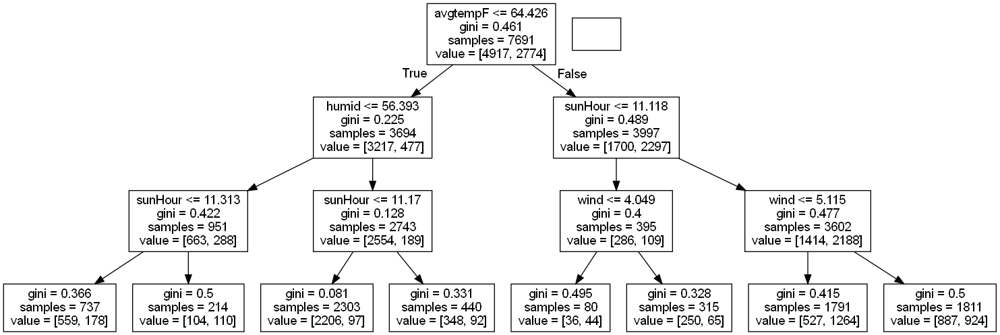

In [34]:
# pruned tree visualization

clf = DecisionTreeClassifier(criterion='gini',max_depth=3,max_leaf_nodes=10)
clf = clf.fit(X_train, y_train)

y_pred_prune = clf.predict(X_test)

y_true, y_pred_prune = y_test, clf.predict(X_test)
print(classification_report(y_true, y_pred_prune))
print("Accuracy: ",accuracy_score(y_test, y_pred_prune))
data = export_graphviz(clf, out_file=None,feature_names=X_train.columns)
graph = pydotplus.graph_from_dot_data(data)
Image(graph.create_png())

In [35]:

conf_matrix = confusion_matrix(y_test, y_pred_prune)
TN = conf_matrix[0][0]
FN = conf_matrix[1][0]
TP = conf_matrix[1][1]
FP = conf_matrix[0][1]
sensitivity_test = TP/(TP+FN)
specificity_test = TN/(FP+TN)
print("Accuracy: ",accuracy_score(y_test, y_pred_prune))
print("percent wildfires correctly predicted (on testing set) : {0:.2f}%\n".format(sensitivity_test*100))
print("percent non-fires correctly predicted (on testing set) : {0:.2f}%\n".format(specificity_test*100))

Accuracy:  0.7461328480436761
percent wildfires correctly predicted (on testing set) : 84.82%

percent non-fires correctly predicted (on testing set) : 68.78%



In [36]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators = 50,max_leaf_nodes=10,n_jobs=-1)
clf.fit(X_train_sc, y_train)
rf_pred=clf.predict(X_test_sc)
conf_matrix = confusion_matrix(y_test, rf_pred)
TN = conf_matrix[0][0]
FN = conf_matrix[1][0]
TP = conf_matrix[1][1]
FP = conf_matrix[0][1]
sensitivity_test = TP/(TP+FN)
specificity_test = TN/(FP+TN)
acc_rf = accuracy_score(y_test, rf_pred)
print("Accuracy: ",acc_rf)
print("clasification report: \n ",classification_report(y_test,rf_pred))
print("percent wildfires correctly predicted (on testing set) : {0:.2f}%\n".format(sensitivity_test*100))
print("percent non-wildfires correctly predicted (on testing set) : {0:.2f}%\n".format(specificity_test*100))

Accuracy:  0.7779799818016379
clasification report: 
                precision    recall  f1-score   support

           0       0.84      0.81      0.82      2098
           1       0.68      0.73      0.71      1199

    accuracy                           0.78      3297
   macro avg       0.76      0.77      0.76      3297
weighted avg       0.78      0.78      0.78      3297

percent wildfires correctly predicted (on testing set) : 72.98%

percent non-wildfires correctly predicted (on testing set) : 80.55%



In [37]:
#STEP 2 NN with 2 Layers
classifier = MLPClassifier(solver='adam',hidden_layer_sizes=(10,15),activation='logistic',learning_rate='constant',
                           learning_rate_init=0.12,alpha=0.00000003, momentum=0.54)
classifier = classifier.fit(X_train_sc, y_train)
pred_2 = classifier.predict(X_test_sc)


#evaluating the algorithm
from sklearn.metrics import classification_report, confusion_matrix
acc_2hl = accuracy_score(y_test, pred_2)
print ("accuracy score: ",acc_2hl)
print("clasification report: \n ",classification_report(y_test,pred_2))
print("confusion matrix: \n ",confusion_matrix(y_test,pred_2))


accuracy score:  0.7794965119805884
clasification report: 
                precision    recall  f1-score   support

           0       0.84      0.81      0.82      2098
           1       0.69      0.72      0.70      1199

    accuracy                           0.78      3297
   macro avg       0.76      0.77      0.76      3297
weighted avg       0.78      0.78      0.78      3297

confusion matrix: 
  [[1702  396]
 [ 331  868]]


In [38]:
#STEP 3 NN with 5 Layers
classifier = MLPClassifier(solver='adam',hidden_layer_sizes=(10,15,15,15,10),activation='logistic',
                           learning_rate='constant',learning_rate_init=0.12,alpha=0.00000003, momentum=0.54)
classifier = classifier.fit(X_train_sc, y_train)
pred_5 = classifier.predict(X_test_sc)


#evaluating the algorithm
from sklearn.metrics import classification_report, confusion_matrix
acc_5hl = accuracy_score(y_test, pred_5)
print ("accuracy score: ",acc_5hl)
print("clasification report: \n ",classification_report(y_test,pred_5))
print("confusion matrix: \n ",confusion_matrix(y_test,pred_5))


accuracy score:  0.7497725204731575
clasification report: 
                precision    recall  f1-score   support

           0       0.88      0.71      0.78      2098
           1       0.62      0.83      0.71      1199

    accuracy                           0.75      3297
   macro avg       0.75      0.77      0.74      3297
weighted avg       0.78      0.75      0.75      3297

confusion matrix: 
  [[1481  617]
 [ 208  991]]


In [39]:
#STEP 4 NN with 4 Layers
classifier = MLPClassifier(solver='adam',hidden_layer_sizes=(10,15,15,10),activation='logistic',
                           learning_rate='constant',learning_rate_init=0.12,alpha=0.00000003, momentum=0.54)
classifier = classifier.fit(X_train_sc, y_train)
pred_4 = classifier.predict(X_test_sc)


#evaluating the algorithm
from sklearn.metrics import classification_report, confusion_matrix
acc_4hl = accuracy_score(y_test, pred_4)
print ("accuracy score: ",acc_4hl)
print("clasification report: \n ",classification_report(y_test,pred_4))
print("confusion matrix: \n ",confusion_matrix(y_test,pred_4))

accuracy score:  0.7700940248710949
clasification report: 
                precision    recall  f1-score   support

           0       0.81      0.83      0.82      2098
           1       0.69      0.67      0.68      1199

    accuracy                           0.77      3297
   macro avg       0.75      0.75      0.75      3297
weighted avg       0.77      0.77      0.77      3297

confusion matrix: 
  [[1734  364]
 [ 394  805]]


In [40]:
from sklearn import svm
#classifier = svm.SVC(kernel='linear', gamma='auto', C=2)
classifier = svm.SVC(C=100.0, kernel='poly', degree=3, gamma='auto', coef0=0.0, shrinking=True, 
                     probability=False, tol=0.001, cache_size=200, class_weight=None, verbose=0, 
                     max_iter=-1, decision_function_shape="ovr", random_state = 0)
classifier.fit(X_train_sc,y_train)
Y_predict_svm = classifier.predict(X_test_sc)

In [41]:

from sklearn.metrics import classification_report
print(classification_report(y_test,Y_predict_svm))
acc_svm = accuracy_score(y_test, Y_predict_svm)
print ("accuracy score: ",acc_svm)

              precision    recall  f1-score   support

           0       0.83      0.81      0.82      2098
           1       0.68      0.72      0.70      1199

    accuracy                           0.77      3297
   macro avg       0.76      0.76      0.76      3297
weighted avg       0.78      0.77      0.78      3297

accuracy score:  0.7749469214437368


In [42]:
# accessing random forest accuracy variables using (%store -r) function 


df_new = pd.DataFrame(columns=['Parameter', 'Dec tree','Random forest', '2 HL NN','5 HL NN','4 HL NN','SVM'])

df_new = df_new.append({'Parameter': ' accuracy score', 'Dec tree':acc_dec,'Random forest': acc_rf , '2 HL NN': acc_2hl,'5 HL NN':acc_5hl,'4 HL NN':acc_4hl,'SVM': acc_svm}, ignore_index=True)

pd.set_option('display.max_colwidth', -1)
df_new

,Parameter,Dec tree,Random forest,2 HL NN,5 HL NN,4 HL NN,SVM
0,accuracy score,0.837731,0.77798,0.779497,0.749773,0.770094,0.774947


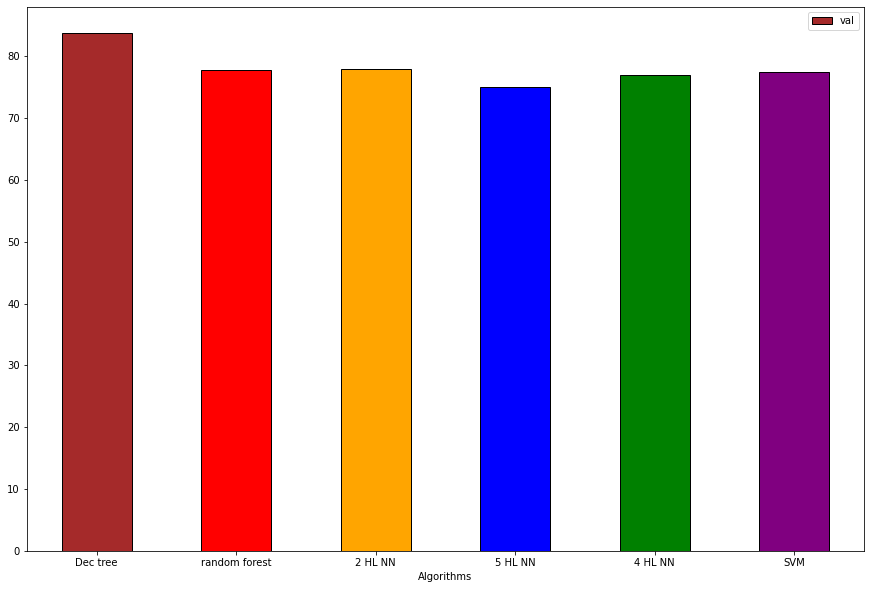

In [43]:
df_bar = pd.DataFrame({'Algorithms':['Dec tree', 'random forest', '2 HL NN', '5 HL NN','4 HL NN','SVM'], 'val':[acc_dec*100, acc_rf*100, acc_2hl*100, acc_5hl*100, acc_4hl*100, acc_svm*100]})
ax = df_bar.plot.bar(x='Algorithms', y='val', rot=0,  color=['brown', 'red', 'orange', 'blue', 'green', 'purple'], figsize=(15,10),edgecolor='black')

<AxesSubplot:xlabel='Algorithms', ylabel='val'>

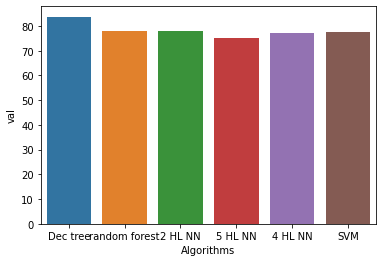

In [44]:
import seaborn as sns
sns.barplot(data=df_bar, x="Algorithms", y="val")